<a href="https://colab.research.google.com/github/Mothmaniaaa/Pollard_Lab-Summer_2024/blob/main/PAMsort.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#######################################################################################
## This code converts .bed style files(with chromosome, start, end format) into individual
## variants, finds the closest PAM site and edits it. Using the deep learning model Enformer,
## we then take predictions and compare edits to the unedited variant to find the edit with
## the lowest Mean Square Error for later correlation tests

# Many of the Enformer functions used come from the original Enformer framework and the
# Pytorch format

In [ ]:
#import needed libraries
!pip install pandas
!pip install tensorflow
!pip install pysam
!pip install openpyxl
!pip install enformer-pytorch
!pip install ipywidgets
!pip install kipoiseq==0.5.2 --quiet > /dev/null
!pip install matplotlib
!pip install seaborn
!pip install scanpy
!pip install igraph
!pip insall sklearn
!pip install scipy

from sklearn.preprocessing import MinMaxScaler
from scipy.stats import pearsonr
import tensorflow as tf
import pandas as pd
import numpy as np
import io
import copy
import re
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inLine
%config InlineBackend.figure_format = 'retina'
import openpyxl
import pysam
import seaborn as sns
import scanpy as sc
import igraph
from enformer_pytorch import Enformer, str_to_one_hot

import torch
import torch.nn.functional as F
from torch.utils.data import Dataset

import kipoiseq
from kipoiseq import Interval

import torch.nn.functional as F
from torch.utils.data import Dataset

import polars as pl

from random import randrange, random
from pathlib import Path

import pyfaidx
from pyfaidx import Fasta


ERROR: unknown command "insall" - maybe you meant "install"


In [ ]:
# code transferred from the original Enformer Version, takes the gene and extracts a
# reference sequence from our fasta file
class FastaStringExtractor:

    def __init__(self, fasta_file):
        self.fasta = pyfaidx.Fasta(fasta_file)
        self._chromosome_sizes = {k: len(v) for k, v in self.fasta.items()}

    def extract(self, interval: Interval, **kwargs) -> str:
        # Truncate interval if it extends beyond the chromosome lengths.
        chromosome_length = self._chromosome_sizes[interval.chrom]
        trimmed_interval = Interval(interval.chrom,
                                    max(interval.start, 0),
                                    min(interval.end, chromosome_length),
                                    )
        # pyfaidx wants a 1-based interval
        sequence = str(self.fasta.get_seq(trimmed_interval.chrom,
                                          trimmed_interval.start + 1,
                                          trimmed_interval.stop).seq).upper()
        # Fill truncated values with N's.
        pad_upstream = 'N' * max(-interval.start, 0)
        pad_downstream = 'N' * max(interval.end - chromosome_length, 0)
        return pad_upstream + sequence + pad_downstream

    def close(self):
        return self.fasta.close()

In [ ]:
#takes sequence interval of PAM site and attempts to find PAM sites arround it
#in: String interval around pam site
#out: true or false output
def PAM_Ends(PAM_interval):
    if PAM_interval[0:2] == 'GG':
        return 'true'
    elif PAM_interval[5:7] == 'GG' or PAM_interval[6:8] == 'GG':
        return 'true'
    else:
        return 'false'

In [ ]:
#imports file containing relevant variants and the reference genome
fasta_path = '/pollard/data/vertebrate_genomes/human/hg38/hg38/hg38.fa'
Variant_List ='/pollard/home/adelatorre/KeckVariants-hg38assembly.xlsx'

In [ ]:
PAM_Rank = pd.read_excel(Variant_List)

In [ ]:
#edits the data frame for our purposes/corrects errors in the variant list
PAM_Rank.loc[14, "chromosome"] = 'chr5'
PAM_Rank.loc[14, "rsid"] = 'rs2434531'
PAM_Rank.loc[14, "alleles"] = 'C>A'
CAGE_Cell_Type = [5115, 5115, 5137, 5112, 5112, 5112, 5112, 4798, 4798, 4684, 4684, 4684, 4684, 4684, 4981]
CHIP_Cell_Type = [1168, 1168, 1147, 1444, 1444, 1444, 1444, 1849, 1849, 2004, 2004, 2004, 2004, 2004, 2536]
DNASE_Cell_Type = [85, 85, 61, 305, 305, 305, 305, 657, 657, 22, 22, 22, 22, 22, 216]

PAM_Rank['CAGE_Cell_Type'] = CAGE_Cell_Type
PAM_Rank['CHIP_Cell_Type'] = CHIP_Cell_Type
PAM_Rank['DNASE_Cell_Type'] = DNASE_Cell_Type
new = ['chr5',154000000,154000000,'C>T','rs2434531', 'GALNT10', 'embryonic brain, others',	'eQTL2, xHAR.170','SNV',1, 4981, 2536, 216]
new1 =['chr19', 13763485,	13763485	,'G>A'	,'NaN','MRI1',' brain cortex','eQTLfinemapped_GTEx','SNV',1,4769,3232, 1]
new2 = ['chr8',	144428520,	144428520,	'G>C',	'rs190185812',	'VPS28',	' brain cortex',	'eQTLfinemapped_GTEx',	'SNV',	1,4769,3232, 1]
new3 = ['chr14',	94129652,	94129652,	'T>C',	'NaN',	'IFI27L2',	'brain cortex',	'eQTLfinemapped_GTEx',	'SNV'	,1,4769,3232, 1]
new4 = ['chr21',	44207698,	44207698,	'A>T',	'rs55708341',	'ICOSLG',	'brain cortex',	'eQTLfinemapped_GTEx',	'SNV',	1,4769,3232, 1]
new5 = ['chr9',	8858303,	8858303,	'C>G',	'rs77301379',	'PTPRD-AS1'	, 'brain cortex',	'eQTLfinemapped_GTEx',	'SNV',	1,4769,3232, 1]
PAM_Rank.loc[len(PAM_Rank)] = new
PAM_Rank.loc[len(PAM_Rank)] = new1
PAM_Rank.loc[len(PAM_Rank)] = new2
PAM_Rank.loc[len(PAM_Rank)] = new3
PAM_Rank.loc[len(PAM_Rank)] = new4
PAM_Rank.loc[len(PAM_Rank)] = new5

In [ ]:
#initializes reference genome
fasta_file = pysam.Fastafile(fasta_path)
fasta_extractor = FastaStringExtractor(fasta_path)
fasta_open = pysam.Fastafile(fasta_path)

In [ ]:
#This function takes a path to the gene variant list and finds the closest PAM site to each variant. It then sorts the variant list from closest to farthest
#in: dataframe containing gene variants and relavant information
#out: dataframe sorted by gene variant distance to a PAM site

def Variant_Sort(Rank):
    Find_Start = 97
    Find_End = 2

    Rank_Temp = list()
    PAM_Bases = list()
    Start_PAM = list()
    End_PAM = list()
    Start_Enf = list()
    End_Enf = list()


    for i in Rank.index:
        #assigns variables to variant chromosome and coordinates
        CHR = Rank['chromosome'].iloc[i]
        POS = Rank['start'].iloc[i]
        END = Rank['end'].iloc[i]

        #fetches 100 bp ranges before and after variant
        Top_Range = fasta_open.fetch(CHR, END, END + 100).upper()
        Bottom_Range = fasta_open.fetch(CHR, POS - 100, POS).upper()

        #Top_Range = fasta_open.fetch(CHR, END, END+100).upper()
        #Bottom_Range = fasta_open.fetch(CHR, POS - 100, POS).upper()

        #finds closest PAM site downstream or upstream of the variant
        #attempts to select PAM sites with minimal PAM sites surrounding it
        Bottom = (len(Bottom_Range) - Bottom_Range.rfind('GG', 0, Find_Start) - 2)
        Bottom_Interval = Bottom_Range[Bottom - 2:Bottom + 5]
        End_1 = PAM_Ends(Bottom_Interval)
        while End_1 == 'true':
            Bottom =  (len(Bottom_Range) - Bottom_Range.rfind('GG', 0, Find_Start) - 2)
            Bottom_Interval = Bottom_Range[Bottom - 2:Bottom + 5]
            Find_Start = Find_Start - 2
            End_1 = PAM_Ends(Bottom_Interval)

        Top = (Top_Range.find('GG', Find_End, 99)) - 1
        Top_Interval = Top_Range[Top - 2:Top + 6]
        End_2 = PAM_Ends(Top_Interval)
        while End_2 == 'true':
            Top = (Top_Range.find('GG', Find_End, 99)) - 1
            Top_Interval = Top_Range[Top - 2:Top + 5]
            Find_End = Find_End + 2
            End_2 = PAM_Ends(Top_Interval)


        #edits data frame depending on upstream and downstream location of the PAM site
        if Bottom <= Top:
            Rank_Temp.append(Bottom)
            PAM_Bases.append(Bottom_Range[(len(Bottom_Range) - Bottom) - 3 : len(Bottom_Range) - Bottom])
            Start_PAM.append(POS - (Bottom + 3))
            End_PAM.append((POS - (Bottom)))
        else:
            Rank_Temp.append(Top)
            PAM_Bases.append(Top_Range[Top:Top + 3])
            Start_PAM.append(END + Top)
            End_PAM.append((END + Top) + 3)
        Find_Start = 97
        Find_End = 2

    #attaches lists to the dataframe
    Rank['Distance_to_PAM_Site'] = Rank_Temp
    Rank['PAM_BP'] = PAM_Bases
    Rank['PAM_Start']= Start_PAM
    Rank['PAM_End'] = End_PAM

    Rank = Rank.sort_values(['Distance_to_PAM_Site']).reset_index(drop=True)
    return Rank


In [ ]:
PAM_Rank = Variant_Sort(PAM_Rank)
PAM_Rank

,chromosome,start,end,alleles,rsid,nearby_genes,cell_type,Model_Cohort,variant_type,length,CAGE_Cell_Type,CHIP_Cell_Type,DNASE_Cell_Type,Distance_to_PAM_Site,PAM_BP,PAM_Start,PAM_End
0,chr8,144428520,144428520,G>C,rs190185812,VPS28,"adult heart, brain cortex",eQTLfinemapped_GTEx,SNV,1,4684,2004,22,1,GGG,144428521,144428524
1,chr8,144428520,144428520,G>C,rs190185812,VPS28,brain cortex,eQTLfinemapped_GTEx,SNV,1,4769,3232,1,1,GGG,144428521,144428524
2,chr10,73529417,73529702,deletion,NaN,"PP3CB, MSS51, ANXA7",iPSC excitatory neurons,Akita_SFARI,CTCF peak within patient SV,286,5112,1444,305,1,AGG,73529703,73529706
3,chr5,154000000,154000000,C>T,rs2434531,GALNT10,"embryonic brain, others","eQTL2, xHAR.170",SNV,1,4981,2536,216,2,TGG,154000002,154000005
4,chr5,154000000,154000000,C>A,rs2434531,GALNT10,"embryonic brain, others","eQTL, 2xHAR.170",SNV,1,4981,2536,216,2,TGG,154000002,154000005
5,chr21,44207698,44207698,A>T,rs55708341,ICOSLG,"adult heart, brain cortex",eQTLfinemapped_GTEx,SNV,1,4684,2004,22,2,AGG,44207700,44207703
6,chr21,44207698,44207698,A>T,rs55708341,ICOSLG,brain cortex,eQTLfinemapped_GTEx,SNV,1,4769,3232,1,2,AGG,44207700,44207703
7,chr15,89737238,89795480,deletion,NaN,"MESP1, MESP2, WDR93",iPSC mesoderm progenitors,Akita_PCGC,CHD patient SV (prior edit alters HiC),58243,5137,1147,61,3,AGG,89737232,89737235
8,chr15,73973054,73973122,deletion,NaN,"STRA6, LOXL1, STOML1",iPSC cardiomyocytes,Akita_PCGC,CHD patient SV (prior edit alters HiC),69,5115,1168,85,6,CGG,73973128,73973131
9,chr1,110714557,110714557,A>T,rs12074788,KCNA3,neural progenitor cells,MPRA_PsychENCODE,SNV,1,4798,1849,657,6,AGG,110714563,110714566


In [ ]:
#Replaces base pair in the sequence
#in: sequence, base pair, and location in the sequence
#out: editted sequence

def Replace_BP(s, newstring, index, nofail=False):
    # raise an error if index is outside of the string
    if not nofail and index not in range(len(s)):
        raise ValueError("index outside given string")

    # if not erroring, but the index is still not in the correct range..
    if index < 0:  # add it to the beginning
        return newstring + s
    if index > len(s):  # add it to the end
        return s + newstring

    # insert the new string between "slices" of the original
    return s[:index] + newstring + s[index + 1:]

In [ ]:
#this function plots gene expression for the entire interval
#in: interval track dictionary, interval, and the iteration of the for loop
#out: plot of gene expression
def Plot_Tracks(tracks, interval, run, height=1.5):

  fig, axes = plt.subplots(len(tracks), 1, figsize=(20, height * len(tracks)), sharex=True)
  for ax, (title, y) in zip(axes, tracks.items()):
    ax.fill_between(np.linspace(interval.start, interval.end, num=len(y)), y)
    ax.set_title(title)
    sns.despine(top=True, right=True, bottom=True)
  ax.set_xlabel(str(interval))
  plt.savefig(str(run))
  plt.tight_layout()

In [ ]:
#returns prediction array from enformer
#in: 196 Kb string sequence
#out: prediction matrix, seperated
def Make_Prediction(Interval):
    import torch
    from enformer_pytorch import Enformer, str_to_one_hot, from_pretrained
    #importing pretrained model from web
    model = from_pretrained('EleutherAI/enformer-official-rough', use_tf_gamma = False)
    #converting sequence from string form to one-hot
    seq = str_to_one_hot(Interval)
    output = model(seq)

    return output['human'] # (1, 896, 5313)

In [ ]:
def PAM_Creation(PAM_interval):
    print(PAM_interval)
    if PAM_interval[1:3] == 'GG' or PAM_interval[0:2] == 'GG':
        return 'true'
    elif PAM_interval[4:6] == 'GG':
        return 'true'
    else:
        return 'false'


In [ ]:
def Sort_by_Another_List(primary_list, sorting_criteria):
    """
    Sorts the primary_list based on the sorting_criteria list.

    Parameters:
    primary_list (list): The list of values to be sorted.
    sorting_criteria (list): The list of values used as the criteria for sorting.

    Returns:
    list: A new list with elements from primary_list sorted based on sorting_criteria.
    """
    # Combine the lists into a list of tuples
    combined_list = list(zip(sorting_criteria, primary_list))

    # Sort the combined list based on the sorting criteria (first item of the tuple)
    sorted_combined_list = sorted(combined_list, key=lambda x: x[0])

    # Extract the sorted primary list
    sorted_primary_list = [item[1] for item in sorted_combined_list]

    return sorted_primary_list


<class 'kipoiseq.dataclasses.Interval'>
AGG
GCAGGCG
[0.47089642]
CGG
GCCGGCG
[0.47089642, 0.06675532]
TGG
GCTGGCG
[0.47089642, 0.06675532, 0.4809417]
GAG
GCGAGCG
[0.47089642, 0.06675532, 0.4809417, 0.58752006]
GCG
GCGCGCG
[0.47089642, 0.06675532, 0.4809417, 0.58752006, 0.81289667]
GTG
GCGTGCG
[0.47089642, 0.06675532, 0.4809417, 0.58752006, 0.81289667, 0.41936287]
GGA
GCGGACG
[0.47089642, 0.06675532, 0.4809417, 0.58752006, 0.81289667, 0.41936287, 0.61158687]
GGC
GCGGCCG
[0.47089642, 0.06675532, 0.4809417, 0.58752006, 0.81289667, 0.41936287, 0.61158687, 0.19134466]
GGT
GCGGTCG
[0.47089642, 0.06675532, 0.4809417, 0.58752006, 0.81289667, 0.41936287, 0.61158687, 0.19134466, 0.44049686]
<class 'kipoiseq.dataclasses.Interval'>
AGG
GCAGGCG
[0.31002313]
CGG
GCCGGCG
[0.31002313, 1.0139986]
TGG
GCTGGCG
[0.31002313, 1.0139986, 0.4933861]
GAG
GCGAGCG
[0.31002313, 1.0139986, 0.4933861, 0.30704498]
GCG
GCGCGCG
[0.31002313, 1.0139986, 0.4933861, 0.30704498, 1.4078465]
GTG
GCGTGCG
[0.31002313, 1.013998

/tmp/ipykernel_15655/4013547095.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(len(tracks), 1, figsize=(20, height * len(tracks)), sharex=True)


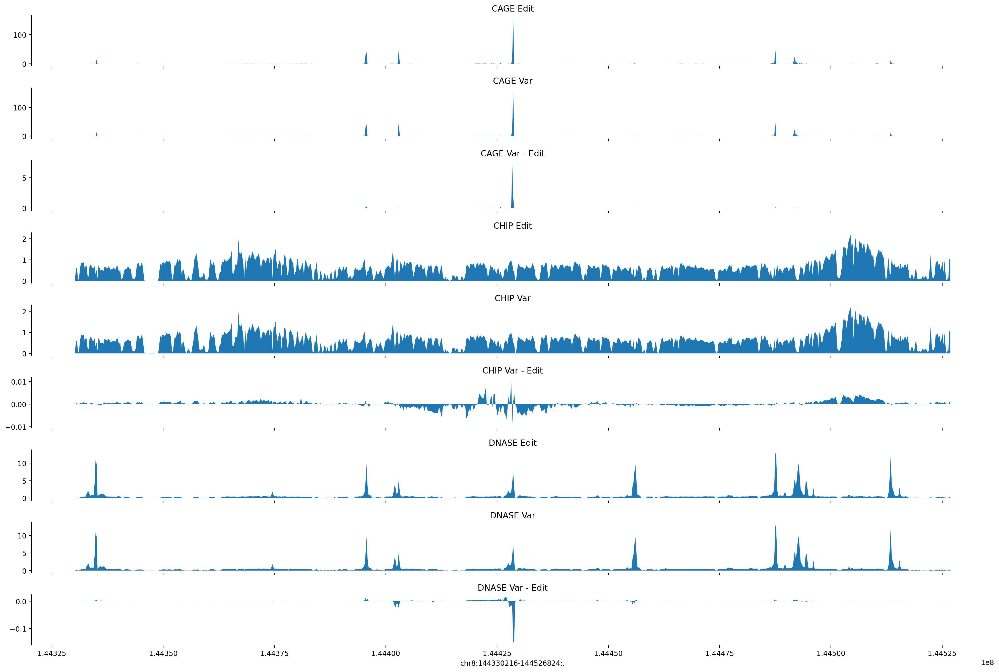

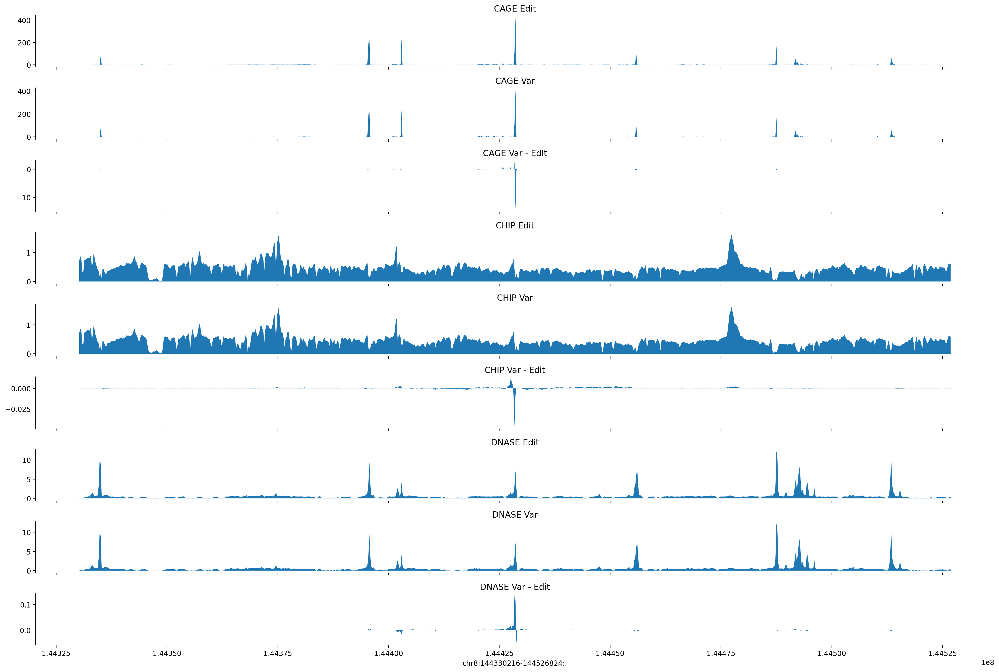

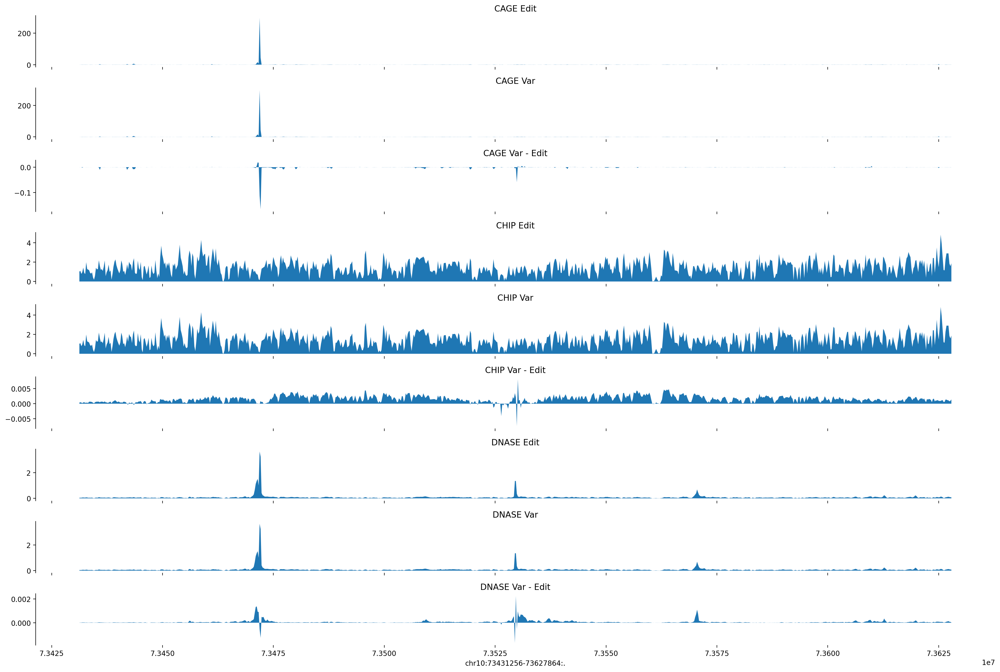

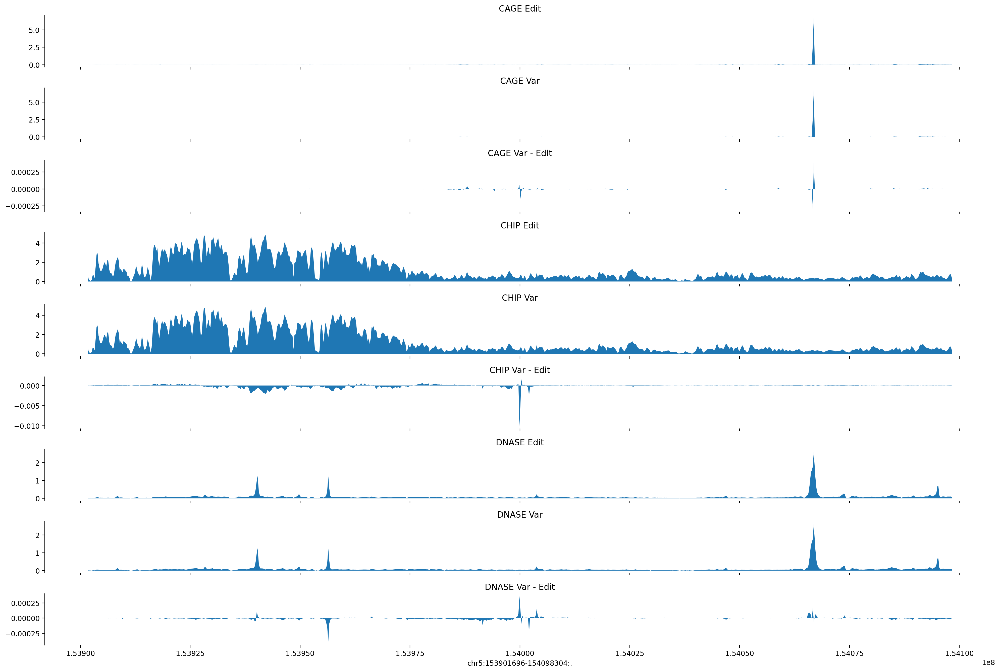

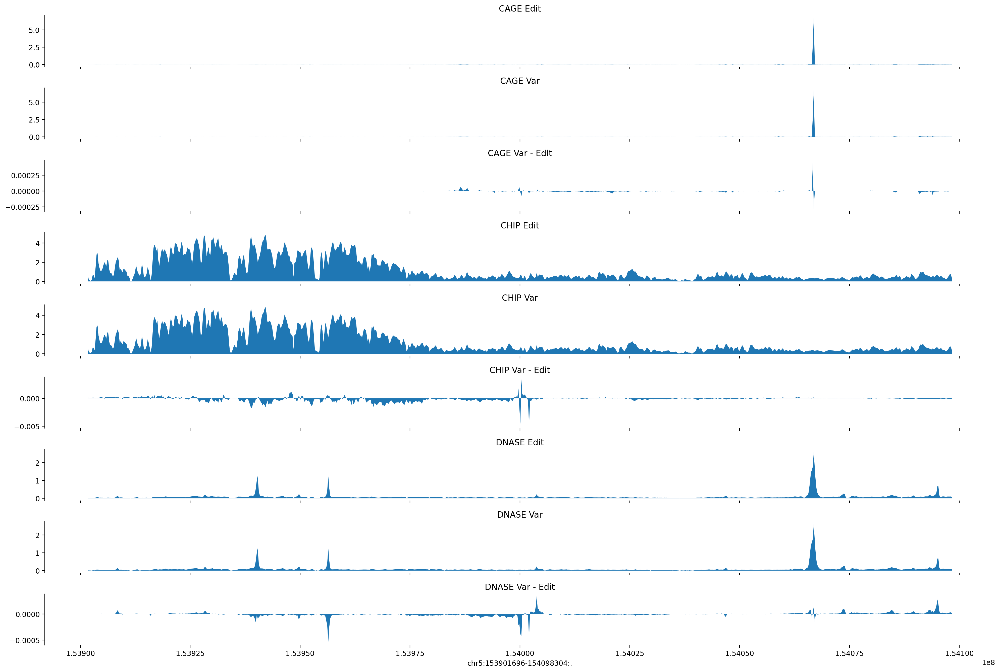

...

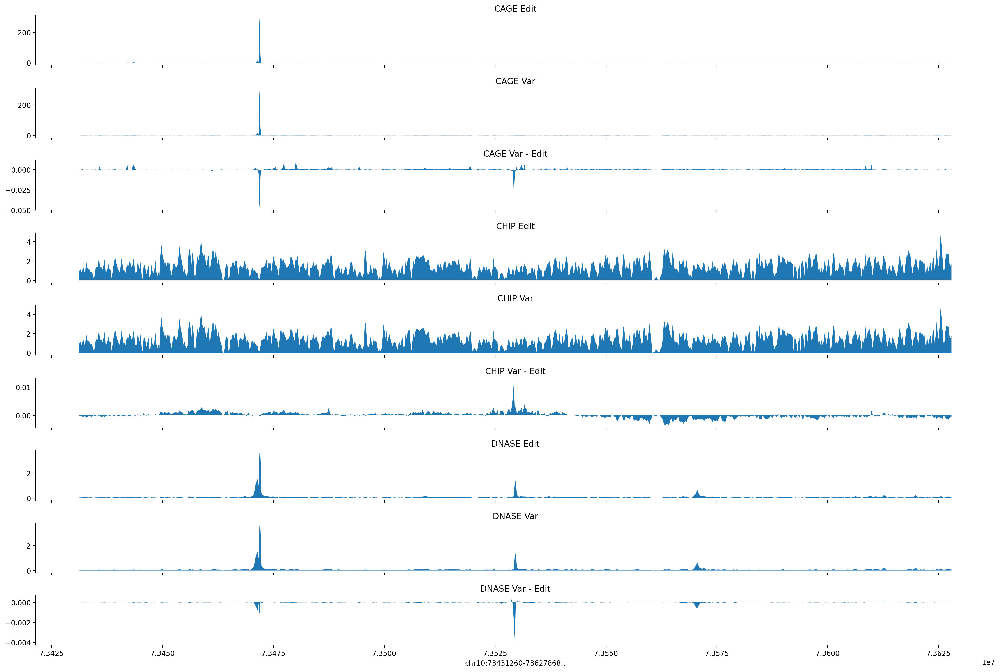

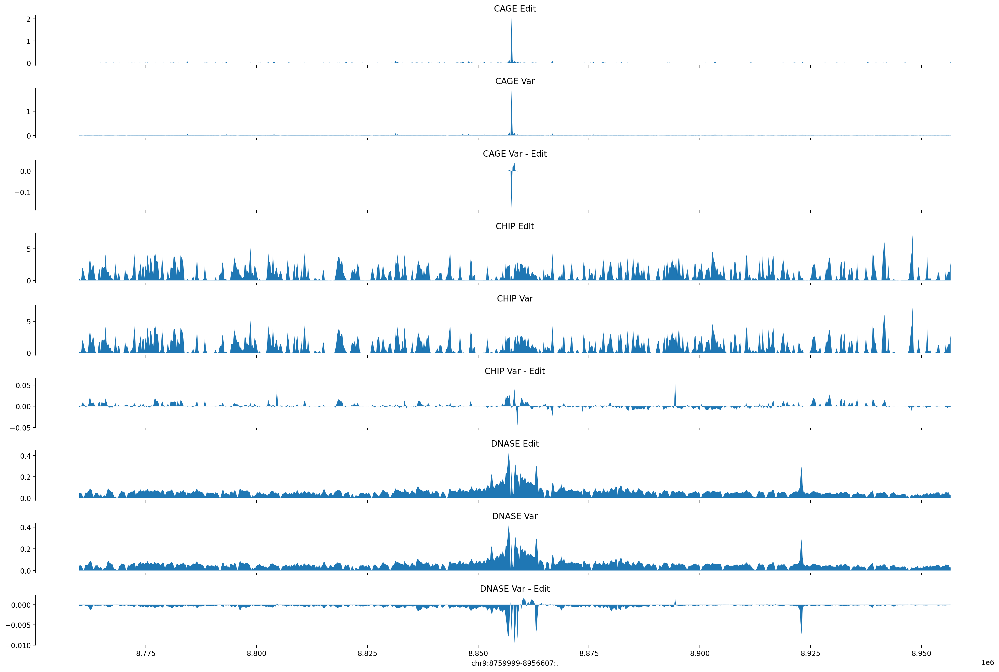

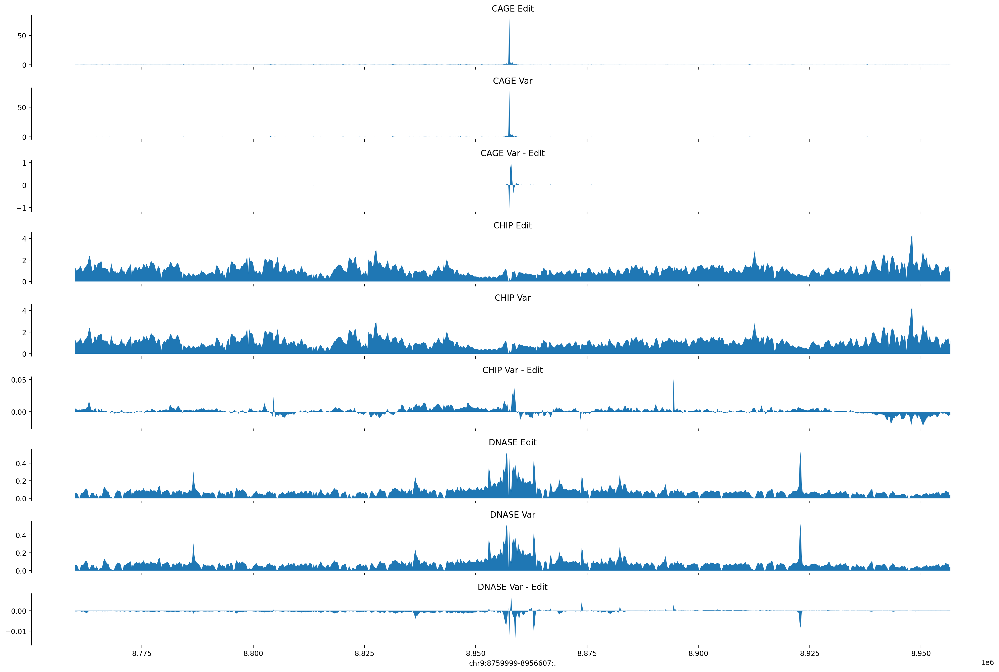

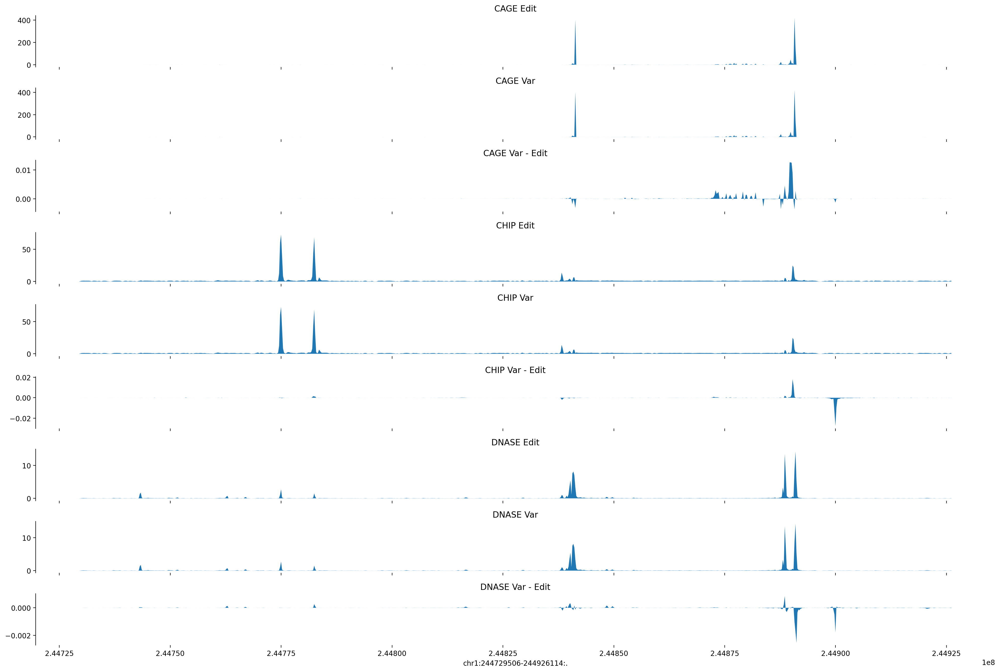

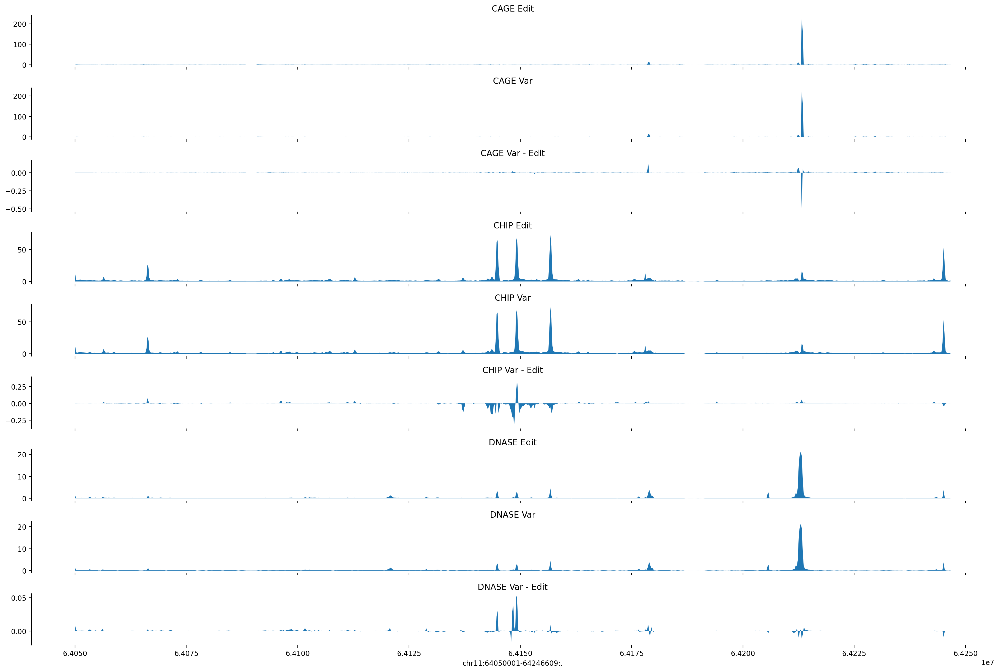

In [ ]:
#This functions takes gene variants and compares them to PAM edited versions and their reference
Variants = PAM_Rank

#initializes constant variables
BP = ['A','C','G','T']
PAM_LENGTH = 3
SEQUENCE_LENGTH = 196608
#lists MSE between variant and reference
CAGE_Gene_diff_list = list()
CHIP_Gene_diff_list = list()
DNASE_Gene_diff_list = list()

#lists closest MSE between variant and edits
CAGE_Closest_diff_list = list()
CHIP_Closest_diff_list = list()
DNASE_Closest_diff_list = list()

#lists gene expression predictions between variants and edits of the edit with the lowest MSE
CAGE_Closest_Predict_list = list()
CHIP_Closest_Predict_list = list()
DNASE_Closest_Predict_list = list()

#lists uneditted variant predictions
CAGE_Base_Predict_list = list()
CHIP_Base_Predict_list = list()
DNASE_Base_Predict_list = list()
####################################################################################################################
#############################################Variant iteration loop#################################################
####################################################################################################################
for index, row in Variants.iterrows():
  #if Variants['Distance_to_PAM_Site'].iloc[index] <= 5:
  CAGE_Edit_list = list()
  CHIP_Edit_list = list()
  DNASE_Edit_list = list()

  CAGE_Predict_list = list()
  CHIP_Predict_list = list()
  DNASE_Predict_list = list()

  Visualize_dict = {'start': 0}
  #importing values form data frame
  CHR = Variants['chromosome'].iloc[index]
  Start = Variants['start'].iloc[index]
  End = Variants['end'].iloc[index]
  Allele = Variants['alleles'].iloc[index]
  Length = Variants['length'].iloc[index]

  CAGE_Cell = Variants['CAGE_Cell_Type'].iloc[index]
  CHIP_Cell = Variants['CHIP_Cell_Type'].iloc[index]
  DNASE_Cell = Variants['DNASE_Cell_Type'].iloc[index]

  PAM_Start = Variants['PAM_Start'].iloc[index]
  PAM_End = Variants['PAM_End'].iloc[index]

  #exracting sequence interval from reference genome
  Base_interval = kipoiseq.Interval(CHR, Start, End)
  Base_interval = fasta_extractor.extract(Base_interval.resize(SEQUENCE_LENGTH))
  #making predictions of the reference genome
  Base_predictions = Make_Prediction(Base_interval)
  #seperates prediction by expression and cell type
  CAGE_Base_predictions = Base_predictions[: , CAGE_Cell]
  CHIP_Base_predictions = Base_predictions[: , CHIP_Cell]
  DNASE_Base_predictions = Base_predictions[: , DNASE_Cell]
  #converts to numpy array for analysis
  CAGE_Base_predictions = CAGE_Base_predictions.detach().numpy()
  CHIP_Base_predictions = CHIP_Base_predictions.detach().numpy()
  DNASE_Base_predictions = DNASE_Base_predictions.detach().numpy()

####################################################################################################################
###############################################Variant sequence script##############################################
####################################################################################################################
  if Allele == 'deletion':
      Start = int(round(Start + Length/2))
      End = Start

      A_interval = kipoiseq.Interval(CHR, Start, End).resize(SEQUENCE_LENGTH)
      print(type(A_interval))
      Allele_interval = fasta_extractor.extract(A_interval)

      Interval_Locate = str(A_interval)
      Interval_Start = int(re.split(":|-", Interval_Locate)[1])
      Interval_End = int(re.split(":|-", Interval_Locate)[2])
  else:
      Allele_Start = re.split(">", Allele)[0]
      Allele_End = re.split(">", Allele)[1]
      Allele_Temp = Allele_Start

      A_interval = kipoiseq.Interval(CHR, Start, End).resize(SEQUENCE_LENGTH)
      print(type(A_interval))
      Allele_interval = fasta_extractor.extract(A_interval)

      Allele_interval = Replace_BP(Base_interval, Allele_End, int(SEQUENCE_LENGTH/2))

      Interval_Locate = str(A_interval)
      Interval_Start = int(re.split(":|-", Interval_Locate)[1])
      Interval_End = int(re.split(":|-", Interval_Locate)[2])

  Allele_predictions = Make_Prediction(Allele_interval)

  CAGE_Allele_predictions = Allele_predictions[:, CAGE_Cell].detach().numpy()
  CHIP_Allele_predictions = Allele_predictions[:, CHIP_Cell].detach().numpy()
  DNASE_Allele_predictions = Allele_predictions[:, DNASE_Cell].detach().numpy()

  CAGE_Gene_diff = np.square(np.subtract(CAGE_Allele_predictions,CAGE_Base_predictions)).mean()
  CHIP_Gene_diff = np.square(np.subtract(CHIP_Allele_predictions,CHIP_Base_predictions)).mean()
  DNASE_Gene_diff = np.square(np.subtract(DNASE_Allele_predictions,DNASE_Base_predictions)).mean()
  #Position of PAM site within sequence
  PAM_Edit = PAM_Start - Interval_Start

######################################################################################################
###############################################Edit Loop##############################################
######################################################################################################
  for a in range(PAM_LENGTH):
      for i in range(len(BP)):
          #deep copy is created for every PAM edit variation
          Edit_interval = copy.deepcopy(Allele_interval)

          if Base_interval[PAM_Edit + a] != BP[i]:
              #print(Edit_interval[PAM_Edit:PAM_Edit + 3])
              #PAM_Interval = fasta_extractor.extract(variant_interval.resize(SEQUENCE_LENGTH))

              Edit_interval = Replace_BP(Allele_interval, BP[i], PAM_Edit + a)
              print(Edit_interval[PAM_Edit:PAM_Edit + 3])

              PAM_interval = Edit_interval[PAM_Edit - 2:PAM_Edit + 5]

              if PAM_Creation(PAM_interval) == 'true':
                  print('skip')
                  continue

              Edit_predictions = Make_Prediction(Edit_interval)

              CAGE_Edit_predictions = Edit_predictions[:, CAGE_Cell].detach().numpy()
              CHIP_Edit_predictions = Edit_predictions[:, CHIP_Cell].detach().numpy()
              DNASE_Edit_predictions = Edit_predictions[:, DNASE_Cell].detach().numpy()

              #print(Edit_predictions)

              CAGE_Edit_diff = np.square(np.subtract(CAGE_Allele_predictions,CAGE_Edit_predictions)).mean()
              CHIP_Edit_diff = np.square(np.subtract(CHIP_Allele_predictions,CHIP_Edit_predictions)).mean()
              DNASE_Edit_diff = np.square(np.subtract(DNASE_Allele_predictions,DNASE_Edit_predictions)).mean()

              CAGE_Edit_list.append(CAGE_Edit_diff)
              CHIP_Edit_list.append(CHIP_Edit_diff)
              DNASE_Edit_list.append(DNASE_Edit_diff)
              print(CAGE_Edit_list)
              CAGE_Predict_list.append(CAGE_Edit_predictions)
              CHIP_Predict_list.append(CHIP_Edit_predictions)
              DNASE_Predict_list.append(DNASE_Edit_predictions)

###########################################################################################################
########################################### sorting script ################################################
###########################################################################################################
  #sorts prediction arrays by relevant MSE values
  CAGE_Predict_list = Sort_by_Another_List(CAGE_Predict_list, CAGE_Edit_list)
  CHIP_Predict_list = Sort_by_Another_List(CHIP_Predict_list, CHIP_Edit_list)
  DNASE_Predict_list = Sort_by_Another_List(DNASE_Predict_list, DNASE_Edit_list)
  #sorts MSE values for the list of gene variants
  CAGE_Edit_list.sort()
  CHIP_Edit_list.sort()
  DNASE_Edit_list.sort()

  CAGE_Closest_diff_list.append(CAGE_Edit_list[0])
  CHIP_Closest_diff_list.append(CHIP_Edit_list[0])
  DNASE_Closest_diff_list.append(DNASE_Edit_list[0])

  CAGE_Closest_Predict = CAGE_Predict_list[0]
  CHIP_Closest_Predict = CHIP_Predict_list[0]
  DNASE_Closest_Predict = DNASE_Predict_list[0]

  CAGE_Closest_Predict_list.append(CAGE_Closest_Predict)
  CHIP_Closest_Predict_list.append(CHIP_Closest_Predict)
  DNASE_Closest_Predict_list.append(DNASE_Closest_Predict)

  CAGE_Gene_diff_list.append(CAGE_Gene_diff)
  CHIP_Gene_diff_list.append(CHIP_Gene_diff)
  DNASE_Gene_diff_list.append(DNASE_Gene_diff)

  Visualize_dict['CAGE Edit'] = CAGE_Closest_Predict
  Visualize_dict['CAGE Var'] = CAGE_Allele_predictions
  Visualize_dict['CAGE Var - Edit'] = CAGE_Allele_predictions - CAGE_Closest_Predict

  Visualize_dict['CHIP Edit'] = CHIP_Closest_Predict
  Visualize_dict['CHIP Var'] = CHIP_Allele_predictions
  Visualize_dict['CHIP Var - Edit'] = CHIP_Allele_predictions - CHIP_Closest_Predict

  Visualize_dict['DNASE Edit'] = DNASE_Closest_Predict
  Visualize_dict['DNASE Var'] =  DNASE_Allele_predictions
  Visualize_dict['DNASE Var - Edit'] =  DNASE_Allele_predictions - DNASE_Closest_Predict

  del Visualize_dict['start']

  Plot_Tracks(Visualize_dict, A_interval, index)

##############################################################################################################
###########################################attachment script##################################################
##############################################################################################################
#attaches Mean Square Error between gene variant expressions and editted gene variant expressions to df
Variants['CAGE_Var_vs_Edit'] = CAGE_Closest_diff_list
Variants['CHIP_Var_vs_Edit'] = CHIP_Closest_diff_list
Variants['DNASE_Var_vs_Edit'] = DNASE_Closest_diff_list
#attaches Mean Square Error between gene variant expressions and gene reference expressions to df
Variants['CAGE_Var_vs_Ref'] = CAGE_Gene_diff_list
Variants['CHIP_Var_vs_Ref'] = CHIP_Gene_diff_list
Variants['DNASE_Var_vs_Ref'] = DNASE_Gene_diff_list

#print(Closest_list)


In [ ]:
test_CAGE = pd.DataFrame(CAGE_Closest_Predict_list)
test_CHIP = pd.DataFrame(CHIP_Closest_Predict_list)
test_DNASE = pd.DataFrame(DNASE_Closest_Predict_list)

control_CAGE = pd.DataFrame(CAGE_Base_Predict_list)
control_CHIP = pd.DataFrame(CHIP_Base_Predict_list)
control_DNASE = pd.DataFrame(DNASE_Base_Predict_list)


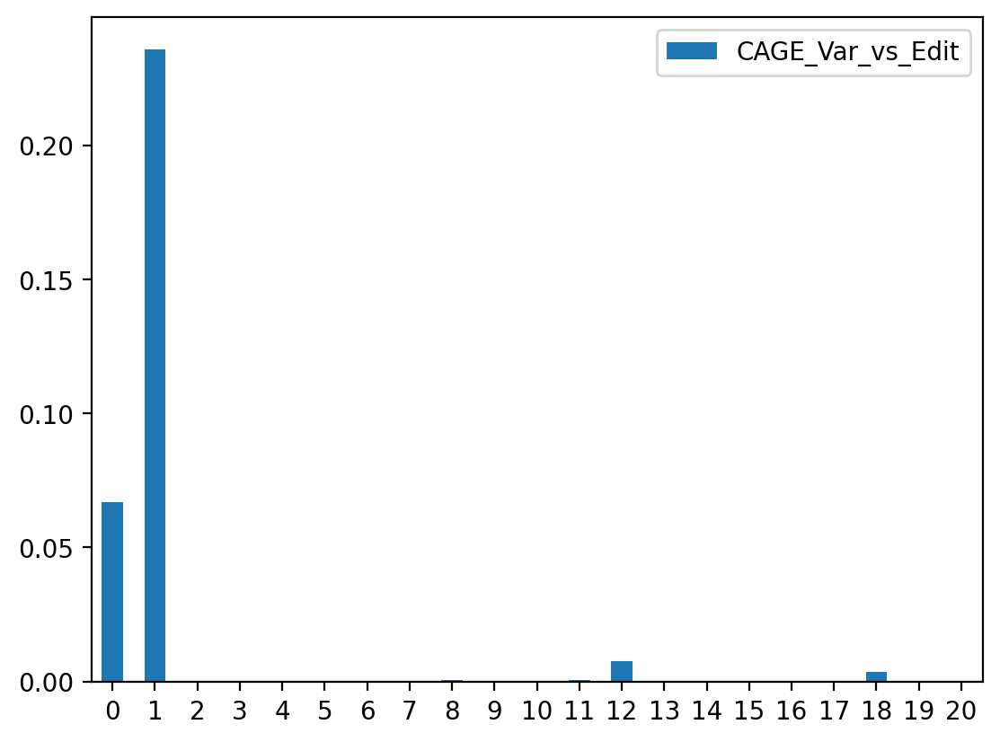

In [ ]:
ax = PAM_Rank.plot.bar(y='CAGE_Var_vs_Edit', rot=0)
plt.show()

In [ ]:
for t in test_CAGE

SyntaxError: expected ':' (2308029519.py, line 1)

In [ ]:

test_CAGE_min_max_scaled = test_CAGE.copy()

# apply normalization techniques
for column in test_CAGE_min_max_scaled.columns:
    test_CAGE_min_max_scaled[column] = (test_CAGE_min_max_scaled[column] - test_CAGE_min_max_scaled[column].min()) / (test_CAGE_min_max_scaled[column].max() - test_CAGE_min_max_scaled[column].min())

test_CHIP_min_max_scaled = test_CHIP.copy()

# apply normalization techniques
for column in test_CHIP_min_max_scaled.columns:
    test_CHIP_min_max_scaled[column] = (test_CHIP_min_max_scaled[column] - test_CHIP_min_max_scaled[column].min()) / (test_CHIP_min_max_scaled[column].max() - test_CHIP_min_max_scaled[column].min())

test_DNASE_min_max_scaled = test_DNASE.copy()

# apply normalization techniques
for column in test_DNASE_min_max_scaled.columns:
    test_DNASE_min_max_scaled[column] = (test_DNASE_min_max_scaled[column] - test_DNASE_min_max_scaled[column].min()) / (test_DNASE_min_max_scaled[column].max() - test_DNASE_min_max_scaled[column].min())


control_CAGE_min_max_scaled = control_CAGE.copy()

# apply normalization techniques
for column in control_CAGE_min_max_scaled.columns:
    control_CAGE_min_max_scaled[column] = (control_CAGE_min_max_scaled[column] - control_CAGE_min_max_scaled[column].min()) / (control_CAGE_min_max_scaled[column].max() - control_CAGE_min_max_scaled[column].min())

control_CHIP_min_max_scaled = control_CHIP.copy()

# apply normalization techniques
for column in control_CHIP_min_max_scaled.columns:
    control_CHIP_min_max_scaled[column] = (control_CHIP_min_max_scaled[column] - control_CHIP_min_max_scaled[column].min()) / (control_CHIP_min_max_scaled[column].max() - control_CHIP_min_max_scaled[column].min())

control_DNASE_min_max_scaled = control_DNASE.copy()

# apply normalization techniques
for column in control_DNASE_min_max_scaled.columns:
    control_DNASE_min_max_scaled[column] = (control_DNASE_min_max_scaled[column] - control_DNASE_min_max_scaled[column].min()) / (control_DNASE_min_max_scaled[column].max() - control_DNASE_min_max_scaled[column].min())


In [ ]:
for count in test_CAGE_min_max_scaled:

    data_1 = test_CAGE_min_max_scaled.iloc[count].tolist()
    data_2 = control_CAGE_min_max_scaled.iloc[count].tolist()
    data_3 = test_CHIP_min_max_scaled.iloc[count].tolist()
    data_4 = control_CHIP_min_max_scaled.iloc[count].tolist()
    data_5 = test_DNASE_min_max_scaled.iloc[count].tolist()
    data_6 = control_DNASE_min_max_scaled.iloc[count].tolist()
    #data = [data_1, data_2, data_3, data_4, data_5, data_6]

    df = pd.DataFrame({
        'Category': [1]*len(data_1) + [2]*len(data_2) + [3]*len(data_3) +
                     [4]*len(data_4) + [5]*len(data_5) + [6]*len(data_6),
        'Value': data_1 + data_2 + data_3 + data_4 + data_5 + data_6
    })

    # Create the plot
    plt.figure(figsize=(12, 8))
    sns.violinplot(x='Category', y='Value', data=df, inner='quartile')

    # Label the plots
    plt.title('Edit Vs Reference Predictions')
    #plt.xlabel('')
    plt.ylabel('Predictions')

    plt.xticks([0, 1, 2, 3, 4, 5], ['CAGE_Edit', 'CAGE_Ref', 'CHIP_Edit', 'CHIP_Ref', 'DNASE_Edit', 'DNASE_Ref'])

    # Show the plot
    print(count)
    plt.show()

AttributeError: module 'seaborn' has no attribute 'boxplots'

<Figure size 1200x800 with 0 Axes>

In [ ]:
corr_list = list()
for var in test_CAGE:
    test_list = test_CAGE.iloc[var].tolist()
    #print(list1)
    control_list = control_CAGE.iloc[var].tolist()
    #print(list2)
    corr, P_value = pearsonr(test_list, control_list)
    corr_list.append(corr)
    print('Pearsons correlation:', corr)
    print("p-value:",P_value)
    print("")


Pearsons correlation: 0.9902089215663357
p-value: 0.0

Pearsons correlation: 0.9969720986160172
p-value: 0.0

Pearsons correlation: 0.9999998454881214
p-value: 0.0

Pearsons correlation: 0.9999999942729655
p-value: 0.0

Pearsons correlation: 0.9999999969654603
p-value: 0.0

Pearsons correlation: 0.9999999488753971
p-value: 0.0

Pearsons correlation: 0.9999999903445023
p-value: 0.0

Pearsons correlation: 0.9913030248695458
p-value: 0.0

Pearsons correlation: 0.9999997786948311
p-value: 0.0

Pearsons correlation: 0.9999670458507322
p-value: 0.0

Pearsons correlation: 0.9999994695288046
p-value: 0.0

Pearsons correlation: 0.9996843199216197
p-value: 0.0

Pearsons correlation: 0.9999231862555333
p-value: 0.0

Pearsons correlation: 0.9999999874477532
p-value: 0.0

Pearsons correlation: 0.9999999956323556
p-value: 0.0

Pearsons correlation: 0.9999998127964819
p-value: 0.0

Pearsons correlation: 0.9999999904401263
p-value: 0.0

Pearsons correlation: 0.9997255529345228
p-value: 0.0

Pearsons c

IndexError: single positional indexer is out-of-bounds